In [1]:
import os
import glob
import pickle
from collections import defaultdict
import io

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import Patch

from PIL import Image
from base64 import b64decode

import nibabel as nib
import h5py

from scipy.spatial import KDTree, cKDTree
from scipy.stats import gaussian_kde

from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.utils import resample

import statsmodels.api as sm

from lameg.surf import interpolate_data
from lameg.viz import show_surface, color_map
from lameg.util import get_files, get_bigbrain_layer_boundaries, big_brain_proportional_layer_boundaries,convert_native_to_fsaverage

In [2]:
%env SUBJECTS_DIR=/home/common/bonaiuto/cued_action_meg/derivatives/processed/fs/

env: SUBJECTS_DIR=/home/common/bonaiuto/cued_action_meg/derivatives/processed/fs/


In [3]:
plt.rcParams.update({
    'font.size': 16,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'xtick.major.size': 6,
    'xtick.major.width': 1.2,
    'ytick.major.size': 6,
    'ytick.major.width': 1.2,
    'legend.frameon': False,
    'legend.handletextpad': 0.1,
    'svg.fonttype': 'none',
    'text.usetex': False
})

In [4]:
def add_subplot_label(ax, label, x=-.21, y=1.225, fontsize=26):
    ax.text(x, y, label,  # Adjust left of y-axis
            transform=ax.transAxes,
            fontsize=fontsize, va='top', ha='right')

def find_peaks(mx, marker="*", return_annot=True):
    annot = np.zeros(mx.shape).astype(np.object_)
    peaks = []
    for l in range(mx.shape[1]):
        peak = np.argmax(mx[:, l]) # here is the problem (you find peak in evaluated!)
        annot[peak,l] = 1.0
        peaks.append(peak)
    peaks = np.array(peaks)
    annot_bin = np.copy(annot).astype(float)
    annot[annot==0.0] = None
    annot[annot==1.0] = marker
    if return_annot:
        return peaks, annot, annot_bin
    else:
        return peaks

In [5]:
out_dir='../output/wb_simulations'
n_layers=11
win_size=50
snr=-20

In [6]:
subj_id='sub-001'
subj_surf_dir=os.path.join('/home/common/bonaiuto/cued_action_meg/derivatives/processed',subj_id,'surf')
# Mesh to use for forward model in the simulations
multilayer_mesh_fname = os.path.join(subj_surf_dir, 'multilayer.11.ds.link_vector.fixed.gii')

# Load multilayer mesh and compute the number of vertices per layer
mesh = nib.load(multilayer_mesh_fname)
verts_per_surf = int(mesh.darrays[0].data.shape[0]/n_layers)

pial_orig_mesh = nib.load(os.path.join(subj_surf_dir, 'pial.gii'))
pial_ds_mesh = nib.load(os.path.join(subj_surf_dir, 'pial.ds.gii'))

multilayer_vertices = mesh.darrays[0].data
multilayer_faces = mesh.darrays[1].data  # Face indices
multilayer_orientations = mesh.darrays[2].data  # Assuming this is the orientation vectors

pial_vertices = pial_orig_mesh.darrays[0].data  # Vertex coordinates
pial_faces = pial_orig_mesh.darrays[1].data  # Face indices

pial_ds_vertices = pial_ds_mesh.darrays[0].data  # Vertex coordinates
pial_ds_faces = pial_ds_mesh.darrays[1].data  # Face indices

scalp_mesh=nib.load(os.path.join('/home/common/bonaiuto/cued_action_meg/derivatives/processed',subj_id,'t1wscalp_2562.surf.gii'))
scalp_vertices = scalp_mesh.darrays[1].data  # Vertex coordinates
scalp_faces = scalp_mesh.darrays[0].data  # Face indices

orig_inflated=nib.load(os.path.join(subj_surf_dir, 'inflated.gii'))
ds_inflated=nib.load(os.path.join(subj_surf_dir, 'inflated.ds.gii'))

In [7]:
# Compute surface normals (if not already available)
def compute_normals(vertices, faces):
    normals = np.zeros_like(vertices)
    for i in range(faces.shape[0]):
        v0, v1, v2 = vertices[faces[i]]
        # Edge vectors
        edge1 = v1 - v0
        edge2 = v2 - v0
        # Cross product to get normal
        normal = np.cross(edge1, edge2)
        normal /= np.linalg.norm(normal)  # Normalize the normal
        normals[faces[i]] += normal
    normals /= np.linalg.norm(normals, axis=1)[:, np.newaxis]  # Normalize all normals
    return normals

normals = compute_normals(scalp_vertices, scalp_faces)

 # Build a KD-tree for the downsampled vertices
tree = cKDTree(scalp_vertices) # pylint: disable=not-callable

# Find the nearest neighbor in the downsampled mesh for each vertex in the original mesh
distances, indices = tree.query(pial_ds_vertices)

# Compute the dot product between the orientation and the normal vectors
dot_products = np.abs(np.einsum('ij,ij->i', normals[indices], multilayer_orientations[:verts_per_surf,:])) 

In [8]:
left_side_view=[-150, -25, -28,
                8, 2.5, -32,
                0.0, -0.37, 1]
right_side_view=[302, 61, 4,
                 3, 44.5, -25,
                 0.0, -0.5, 1]
top_view=[96, -135, 172,
          92, 22, -23,
          -0.03, 1, .75]
back_view=[88, -200, -146,
           92, 22, -23,
           .1, -0.5, 1]

In [9]:
# Plot colors and camera view
# Interpolate for display on the original inflated surface
interpolated_data = interpolate_data(orig_inflated, ds_inflated, dot_products)

c_range = [np.min(interpolated_data), np.max(interpolated_data)]

# Plot change in power on each surface
colors,_ = color_map(
    interpolated_data, 
    "magma", 
    0, 
    1,
    norm='N'
)
l_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=left_side_view)
r_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=right_side_view)
t_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=top_view)
b_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=back_view)

Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


In [10]:
l_plot.fetch_screenshot()
r_plot.fetch_screenshot()
t_plot.fetch_screenshot()
b_plot.fetch_screenshot()

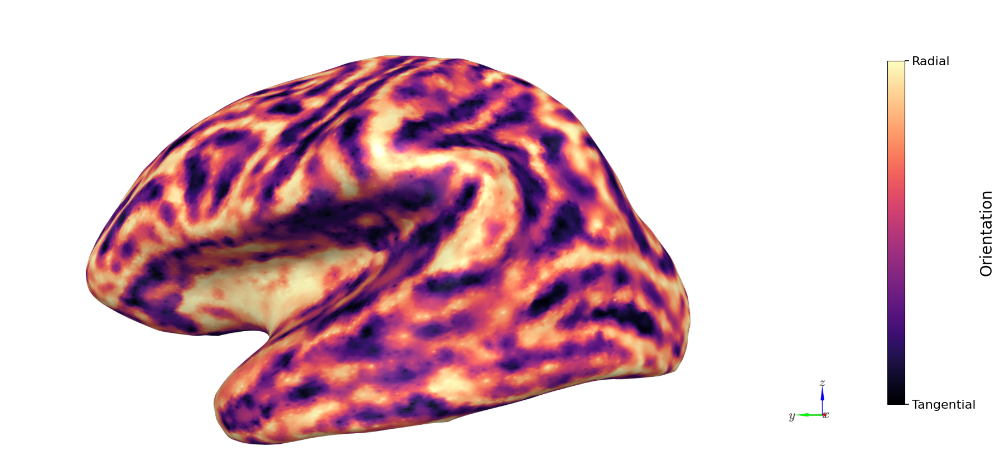

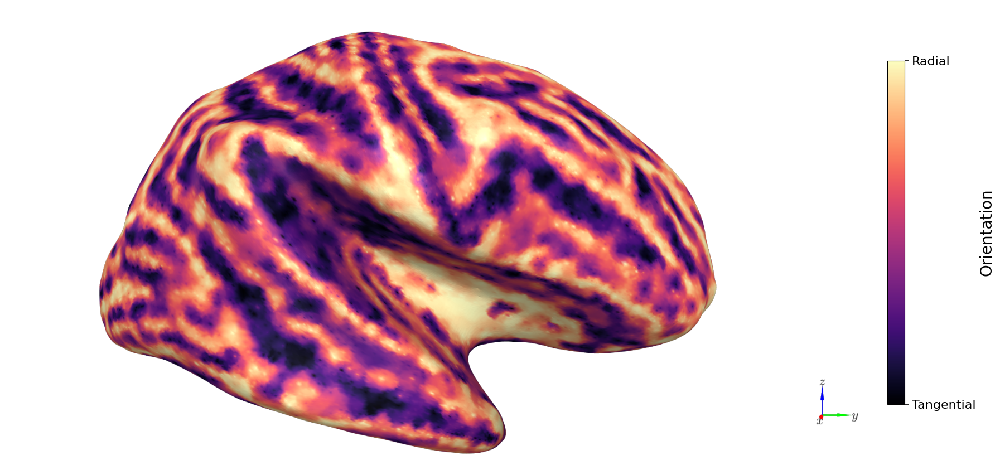

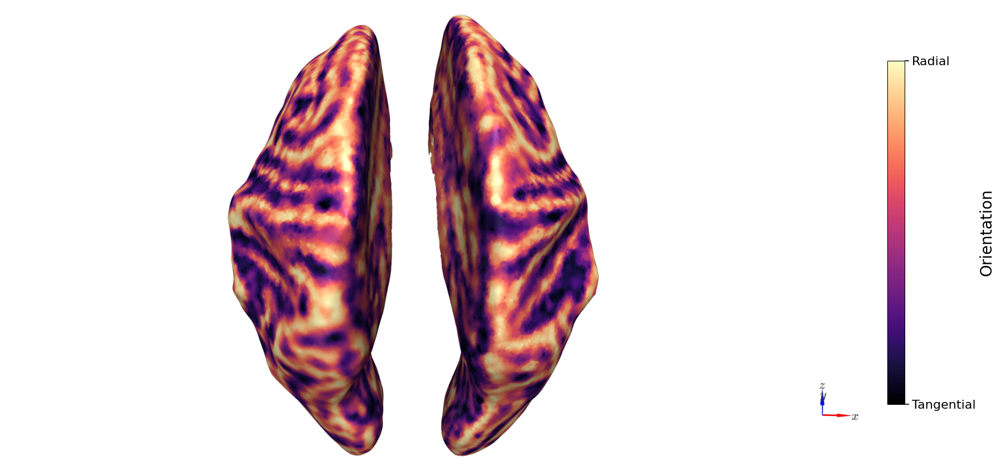

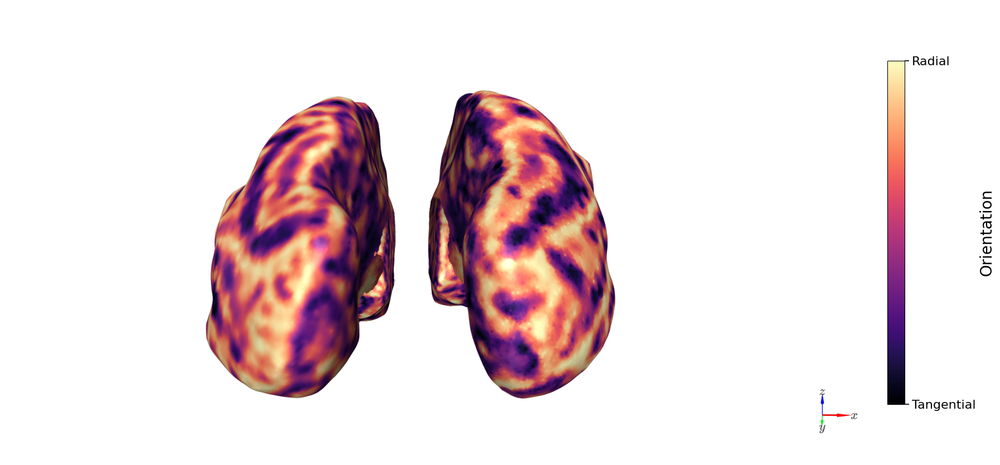

In [11]:
plts=[l_plot, r_plot, t_plot, b_plot]
lbls=['left','right','top','back']

for v_plt, v_lbl in zip(plts, lbls):
    # Decode the screenshot
    image_data = b64decode(v_plt.screenshot)
    image = Image.open(io.BytesIO(image_data))
    image_array = np.array(image)

    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(24, 16))
    ax.imshow(image_array)
    ax.axis('off')  # Hide axes

    # Create a ScalarMappable for the colorbar
    vmin, vmax = np.min(interpolated_data), np.max(interpolated_data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="magma")

    # Add colorbar
    cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.5, aspect=20, pad=0.02)
    cbar.set_label("Orientation", fontsize=20)

    # Set two ticks: at min (vmin) and max (vmax)
    cbar.set_ticks([vmin, vmax])
    cbar.set_ticklabels(["Tangential", "Radial"])

    #add_subplot_label(ax, 'a', fontsize=54)

    # Show and save figure
    plt.savefig(f"figure_08_orientation_{v_lbl}.pdf")


In [10]:
# Plot colors and camera view
interpolated_data = interpolate_data(orig_inflated, ds_inflated, distances)
c_range = [np.percentile(interpolated_data,1), np.percentile(interpolated_data,99)]

# Plot change in power on each surface
colors,_ = color_map(
    interpolated_data, 
    "magma", 
    c_range[0], 
    c_range[1],
    norm='N'
)
l_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=left_side_view)
r_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=right_side_view)
t_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=top_view)
b_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=back_view)

Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


In [13]:
l_plot.fetch_screenshot()
r_plot.fetch_screenshot()
t_plot.fetch_screenshot()
b_plot.fetch_screenshot()

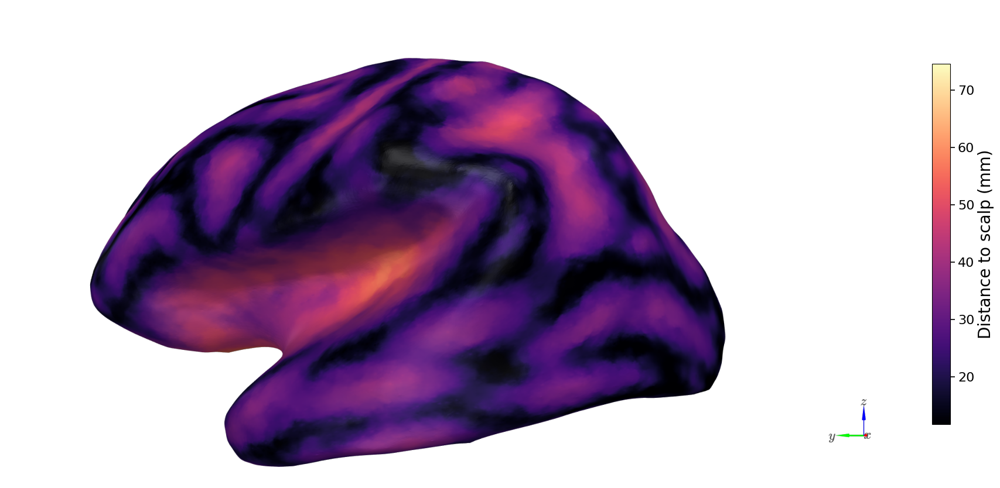

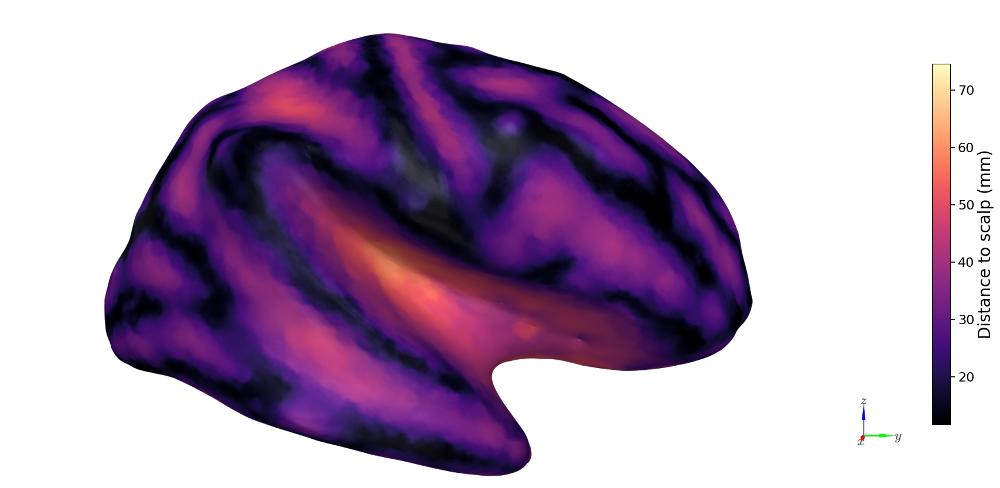

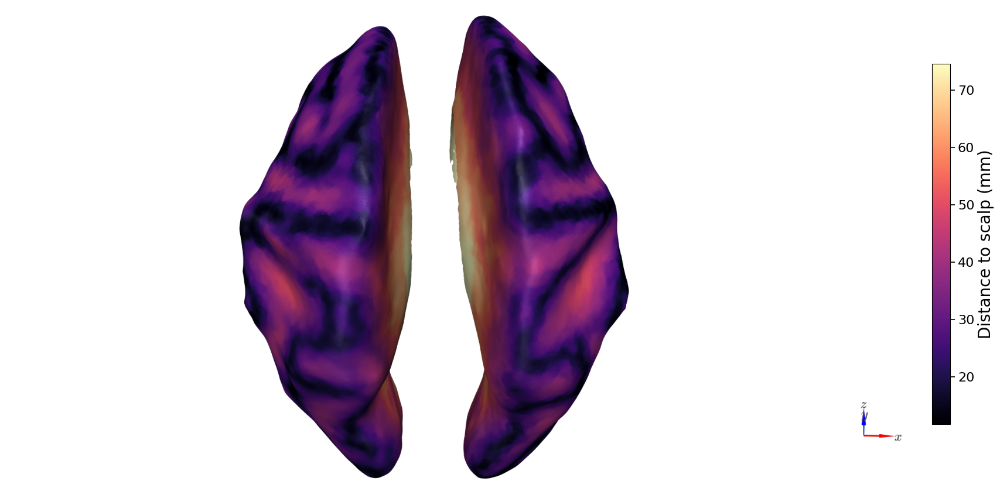

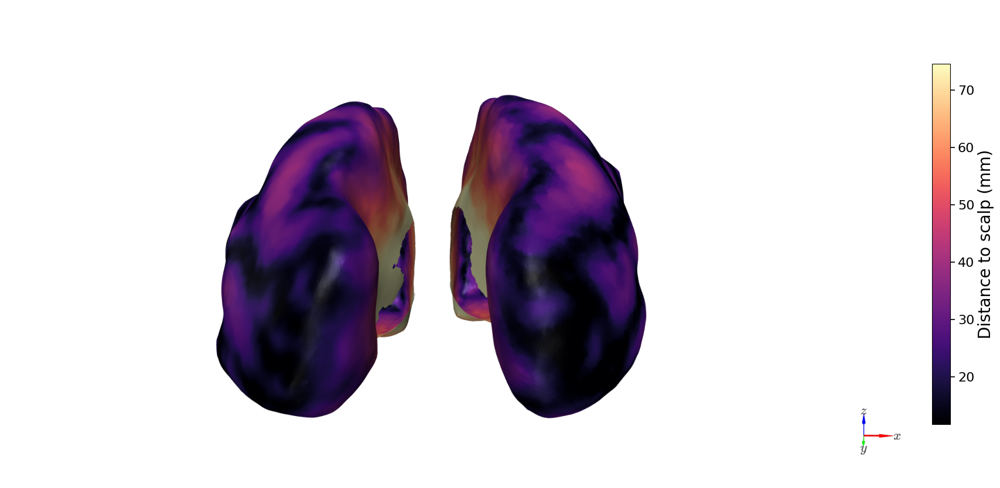

In [14]:
plts=[l_plot, r_plot, t_plot, b_plot]
lbls=['left','right','top','back']

for v_plt, v_lbl in zip(plts, lbls):
    # Decode the screenshot
    image_data = b64decode(v_plt.screenshot)
    image = Image.open(io.BytesIO(image_data))
    image_array = np.array(image)

    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(24, 16))
    ax.imshow(image_array)
    ax.axis('off')  # Hide axes

    # Create a ScalarMappable for the colorbar
    vmin, vmax = np.min(interpolated_data), np.max(interpolated_data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="magma")

    # Add colorbar
    cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.5, aspect=20, pad=0.02)
    cbar.set_label("Distance to scalp (mm)", fontsize=20)

    #add_subplot_label(ax, 'b', fontsize=54)

    # Show and save figure
    plt.savefig(f"figure_08_distance_{v_lbl}.pdf")


In [11]:
gainmat='../output/wb_simulations/SPMgainmatrix_pcspm_converted_autoreject-sub-001-ses-01-motor-epo_1.mat'
with h5py.File(gainmat,'r') as file:
    lf_mat=file['G'][()]
lf_mat.shape

(320430, 275)

In [12]:
thickness=np.sqrt(np.sum((mesh.darrays[0].data[:verts_per_surf,:]-mesh.darrays[0].data[(n_layers-1)*verts_per_surf:,:])**2,axis=-1))

In [13]:
# Plot colors and camera view
interpolated_data = interpolate_data(orig_inflated, ds_inflated, thickness)
c_range = [np.percentile(interpolated_data,1), np.percentile(interpolated_data,99)]

# Plot change in power on each surface
colors,_ = color_map(
    interpolated_data, 
    "magma", 
    c_range[0], 
    c_range[1],
    norm='N'
)
l_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=left_side_view)
r_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=right_side_view)
t_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=top_view)
b_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=back_view)

Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


In [18]:
l_plot.fetch_screenshot()
r_plot.fetch_screenshot()
t_plot.fetch_screenshot()
b_plot.fetch_screenshot()

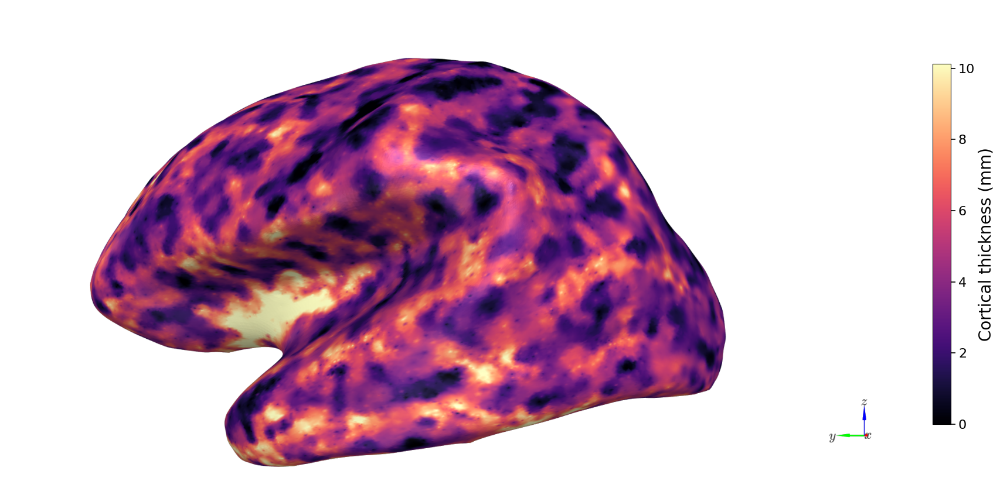

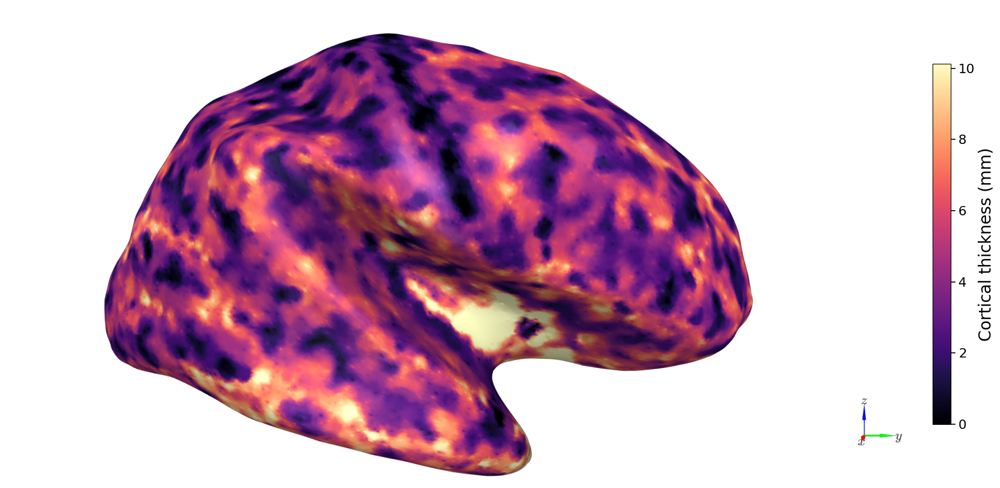

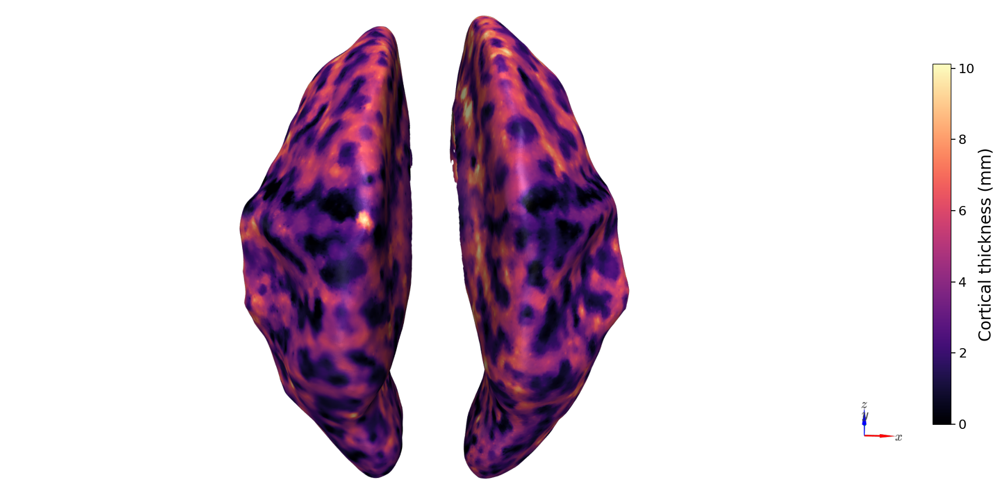

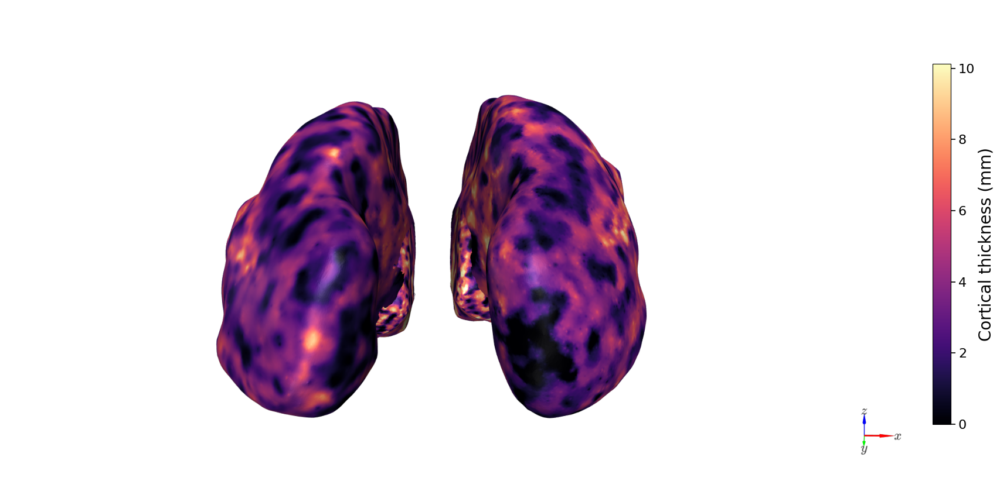

In [19]:
plts=[l_plot, r_plot, t_plot, b_plot]
lbls=['left','right','top','back']

for v_plt, v_lbl in zip(plts, lbls):
    # Decode the screenshot
    image_data = b64decode(v_plt.screenshot)
    image = Image.open(io.BytesIO(image_data))
    image_array = np.array(image)

    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(24, 16))
    ax.imshow(image_array)
    ax.axis('off')  # Hide axes

    # Create a ScalarMappable for the colorbar
    vmin, vmax = np.min(interpolated_data), np.max(interpolated_data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="magma")

    # Add colorbar
    cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.5, aspect=20, pad=0.02)
    cbar.set_label("Cortical thickness (mm)", fontsize=20)

    #add_subplot_label(ax, 'c', fontsize=54)

    # Show and save figure
    plt.savefig(f"figure_08_thickness_{v_lbl}.pdf")


In [14]:
def compute_bias(matrix):
    if matrix.shape[0] != matrix.shape[1]:
        raise ValueError("The input matrix must be square.")
    
    n = matrix.shape[0]
    bias = np.zeros((n,1))
    
    # Loop through each column and check if the maximum value is on the diagonal
    for j in range(n):
        max_index = np.argmax(matrix[:, j])
        bias[j] = max_index-j 
    
    return np.mean(bias)


def compute_error(matrix):
    if matrix.shape[0] != matrix.shape[1]:
        raise ValueError("The input matrix must be square.")
    
    n = matrix.shape[0]
    error = np.zeros((n,1))
    
    # Loop through each column and check if the maximum value is on the diagonal
    for j in range(n):
        max_index = np.argmax(matrix[:, j])
        error[j] = np.abs(j-max_index)
    
    return np.mean(error)

In [15]:
vert_bb_prop = get_bigbrain_layer_boundaries(subj_id, subj_surf_dir)

In [16]:
v_idx=[]
bias_surf=[]
bias_mm=[]
error_surf=[]
error_mm=[]
error_layer_surf=[]
error_layer_mm=[]
error_laminae=[]

fnames=sorted(glob.glob(os.path.join(out_dir, f'vx_*_snr_{snr}_winsize_{win_size}.pickle')))
for f_idx, fname in enumerate(fnames):
    with open(fname,'rb') as file:
        results=pickle.load(file)
    vertex=results['sim_vertex']
    norm_layerF = np.zeros((n_layers, n_layers))
    v_err=[]
    v_err_mm=[]
    for l in range(n_layers):
        norm_layerF[:,l] = results['layerF'][:,l]-np.min(results['layerF'][:,l])                
        v_err.append(np.abs(np.argmax(norm_layerF[:,l])-l))
        v_err_mm.append(np.abs(np.argmax(norm_layerF[:,l])-l)*thickness[vertex])
    error_layer_surf.append(v_err)
    error_layer_mm.append(v_err_mm)

    b = compute_bias(norm_layerF)
    e = compute_error(norm_layerF)
    v_idx.append(vertex)
    bias_surf.append(b)
    bias_mm.append(b*thickness[vertex])
    error_surf.append(e)
    error_mm.append(e*thickness[vertex])
    
    peaks, _, _ = find_peaks(norm_layerF)
    surf_bb_bounds=(n_layers*vert_bb_prop[:,vertex])
    simulated_laminae=np.digitize(np.arange(n_layers), surf_bb_bounds)
    peak_laminae=np.digitize(peaks, surf_bb_bounds)
    v_err=[]
    for l in range(6):
        l_idx=np.where(simulated_laminae==l)[0]
        v_err.append(np.mean(np.abs(l-peak_laminae[l_idx])))
    error_laminae.append(v_err)
    
    
v_idx=np.array(v_idx)
bias_surf=np.array(bias_surf)
bias_mm=np.array(bias_mm)
error_surf=np.array(error_surf)
error_mm=np.array(error_mm)
error_layer_surf=np.array(error_layer_surf)
error_layer_mm=np.array(error_layer_mm)
error_laminae=np.array(error_laminae)

/home/bonaiuto/miniconda3/envs/lameg_0.0.7/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/bonaiuto/miniconda3/envs/lameg_0.0.7/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [17]:
len(v_idx)

29130

In [18]:
n_err=len(np.where(error_mm==0)[0])
perc_err=n_err/verts_per_surf*100
print(f'Zero error vertices={n_err}/{verts_per_surf}, {perc_err:.2f}%')

Zero error vertices=24699/29130, 84.79%


In [19]:
layer_lf_mat=np.zeros((verts_per_surf, n_layers, lf_mat.shape[1]))
diff_layer_lf_mat=np.zeros((verts_per_surf, n_layers))
for i in range(n_layers):
    layer_lf_mat[:,i,:]=lf_mat[i*verts_per_surf:(i+1)*verts_per_surf,:]
for j in range(verts_per_surf):
    for i in range(n_layers):
        diff_layer_lf_mat[j,i]=np.sqrt(np.mean((layer_lf_mat[j,i,:]-layer_lf_mat[j,0,:])**2))

In [20]:
# Plot colors and camera view
interpolated_data = interpolate_data(orig_inflated, ds_inflated, diff_layer_lf_mat[:,-1])
c_range = [np.percentile(interpolated_data,1), np.percentile(interpolated_data,99)]

# Plot change in power on each surface
colors,_ = color_map(
    interpolated_data, 
    "magma", 
    c_range[0], 
    c_range[1],
    norm='N'
)
l_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=left_side_view)
r_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=right_side_view)
t_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=top_view)
b_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=back_view)

Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


In [27]:
l_plot.fetch_screenshot()
r_plot.fetch_screenshot()
t_plot.fetch_screenshot()
b_plot.fetch_screenshot()

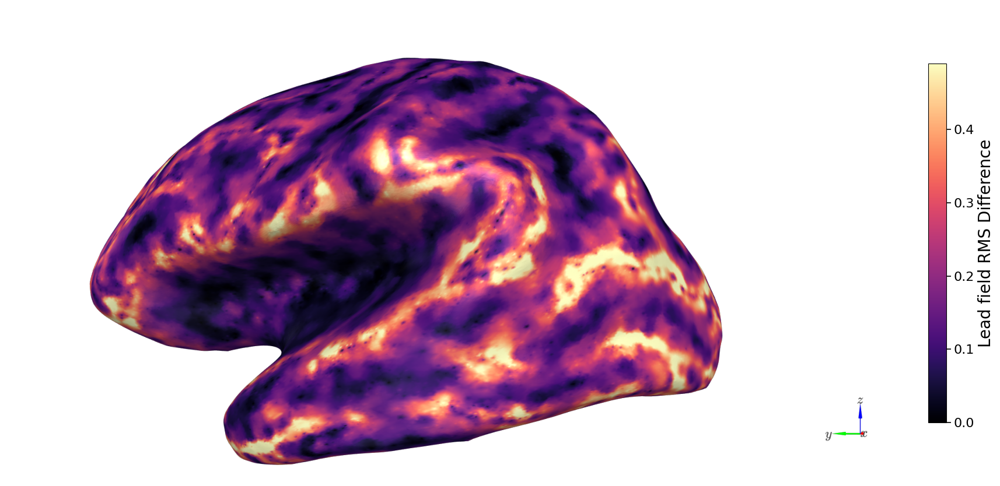

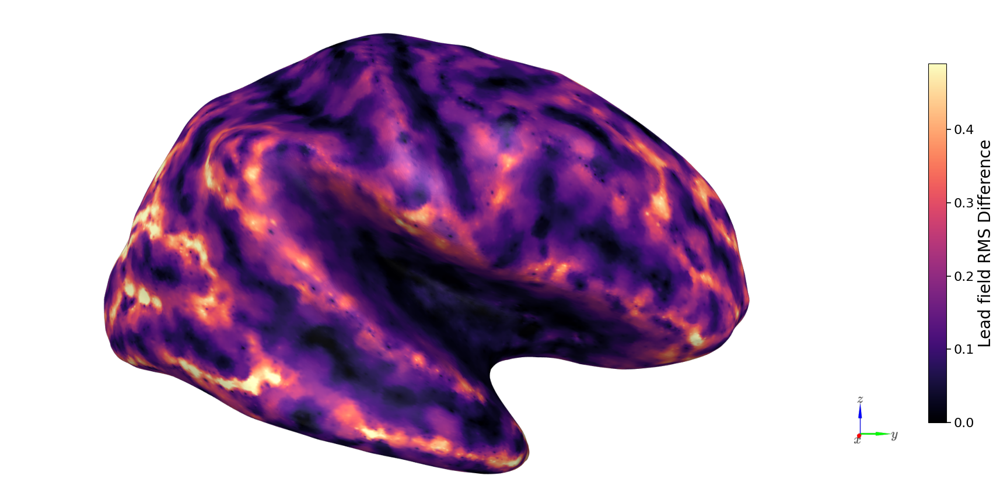

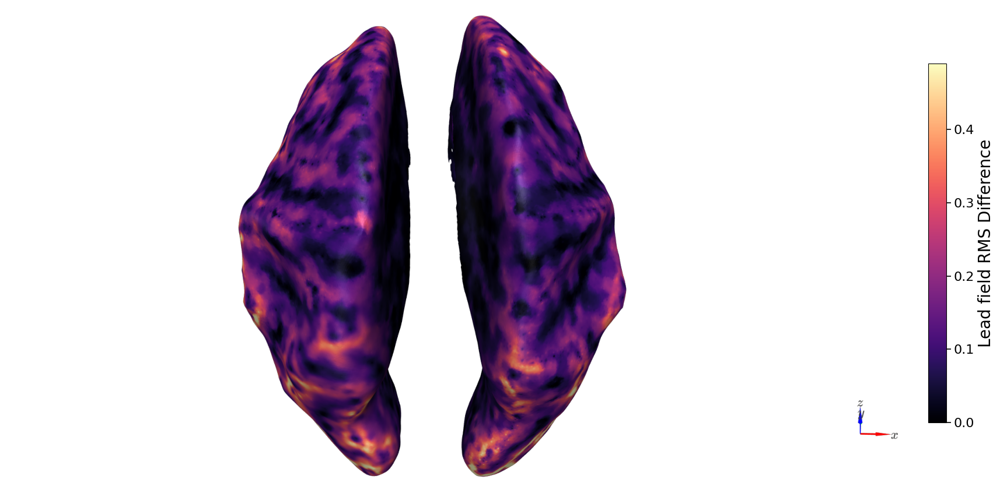

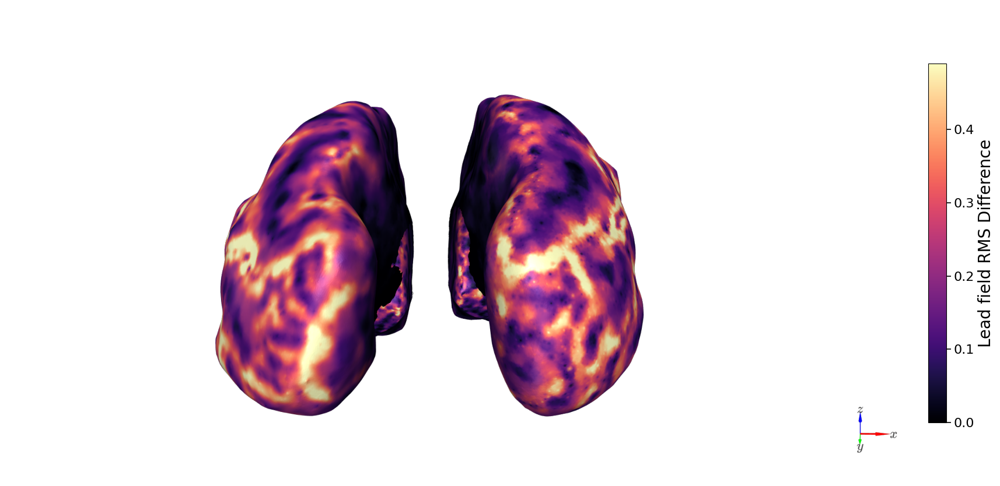

In [28]:
plts=[l_plot, r_plot, t_plot, b_plot]
lbls=['left','right','top','back']

for v_plt, v_lbl in zip(plts, lbls):
    # Decode the screenshot
    image_data = b64decode(v_plt.screenshot)
    image = Image.open(io.BytesIO(image_data))
    image_array = np.array(image)

    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(24, 16))
    ax.imshow(image_array)
    ax.axis('off')  # Hide axes

    # Create a ScalarMappable for the colorbar
    vmin, vmax = np.min(interpolated_data), np.max(interpolated_data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="magma")

    # Add colorbar
    cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.5, aspect=20, pad=0.02)
    cbar.set_label("Lead field RMS Difference", fontsize=20)

    #add_subplot_label(ax, 'd', fontsize=54)

    # Show and save figure
    plt.savefig(f"figure_08_lead_field_{v_lbl}.pdf")

In [21]:
# Plot colors and camera view
error_all=np.zeros(verts_per_surf)
error_all[v_idx]=error_mm
interpolated_data = interpolate_data(orig_inflated, ds_inflated, error_all)
c_range = [0, np.percentile(interpolated_data,99.9)]

# Plot change in power on each surface
colors,_ = color_map(
    interpolated_data, 
    "magma", 
    c_range[0], 
    c_range[1],
    norm='N'
)
l_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=left_side_view)
r_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=right_side_view)
t_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=top_view)
b_plot = show_surface(orig_inflated, vertex_colors=colors, info=True, camera_view=back_view)

Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


Output()

317496 vertices


In [30]:
l_plot.fetch_screenshot()
r_plot.fetch_screenshot()
t_plot.fetch_screenshot()
b_plot.fetch_screenshot()

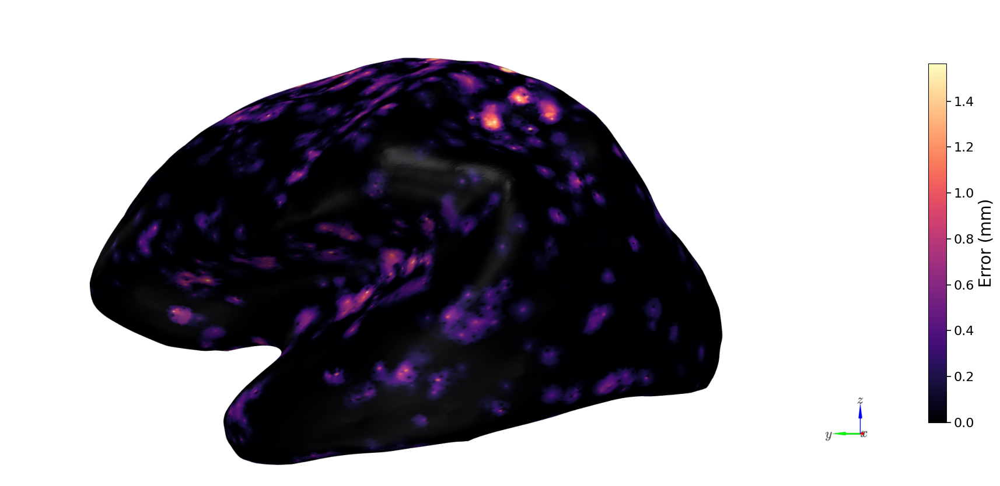

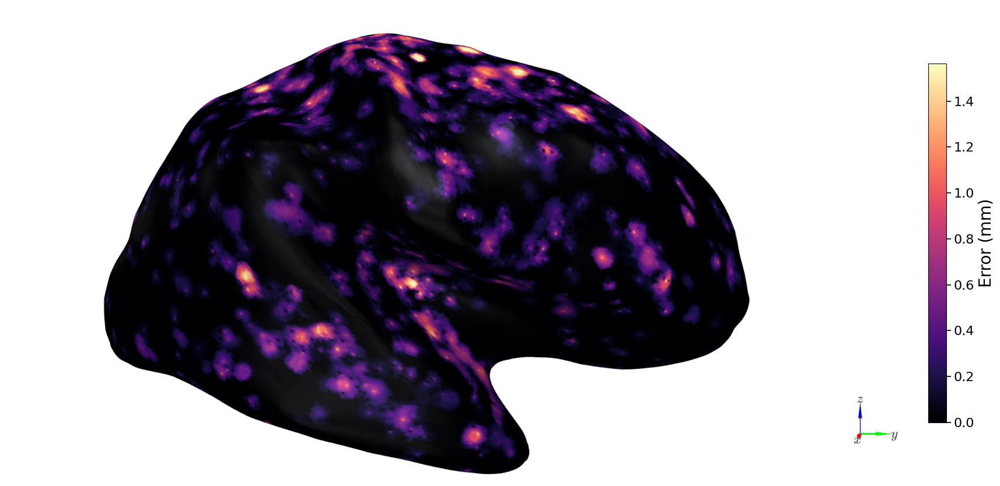

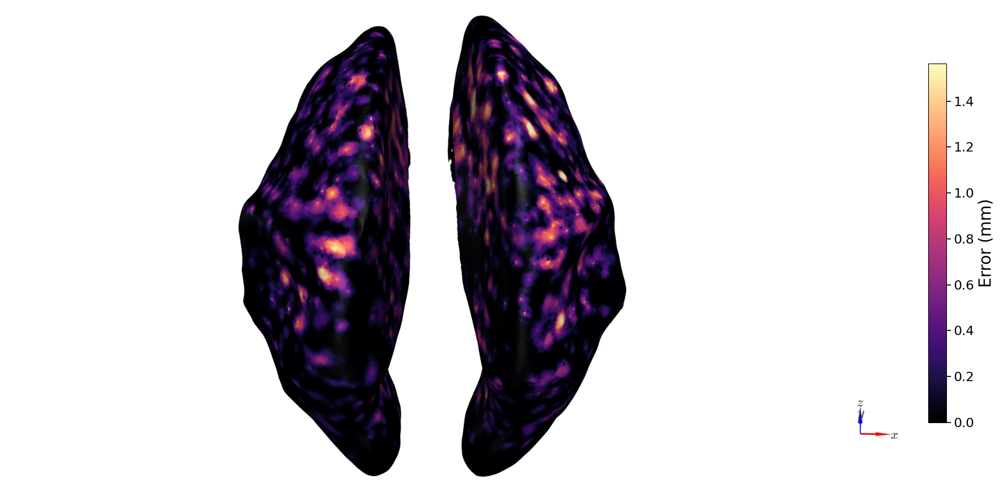

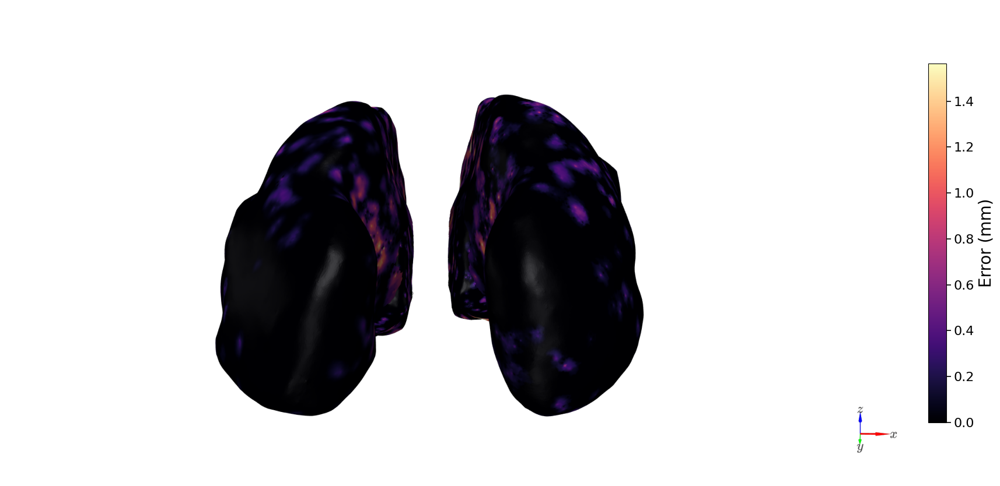

In [31]:
plts=[l_plot, r_plot, t_plot, b_plot]
lbls=['left','right','top','back']

for v_plt, v_lbl in zip(plts, lbls):
    # Decode the screenshot
    image_data = b64decode(v_plt.screenshot)
    image = Image.open(io.BytesIO(image_data))
    image_array = np.array(image)

    # Set up figure and axis
    fig, ax = plt.subplots(figsize=(24, 16))
    ax.imshow(image_array)
    ax.axis('off')  # Hide axes

    # Create a ScalarMappable for the colorbar
    vmin, vmax = np.min(interpolated_data), np.max(interpolated_data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="magma")

    # Add colorbar
    cbar = plt.colorbar(scalar_mappable, ax=ax, shrink=0.5, aspect=20, pad=0.02)
    cbar.set_label("Error (mm)", fontsize=20)

    #add_subplot_label(ax, 'e', fontsize=54)

    # Show and save figure
    plt.savefig(f"figure_08_error_mm_{v_lbl}.pdf")

In [22]:
# Function to find optimal threshold within range
def find_best_threshold(values, errors, plot=False):
    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(errors, values)
    roc_auc = auc(fpr, tpr)
    
    # Flip values if needed
    if roc_auc < 0.5:
        values = -values  
        fpr, tpr, thresholds = roc_curve(errors, values)
        roc_auc = auc(fpr, tpr)
        thresholds = -thresholds  

    # Compute Youden's J statistic
    j_scores = tpr - fpr
    optimal_idx = np.argmax(j_scores)
    optimal_threshold = thresholds[optimal_idx]

    # Compute Precision-Recall curve and AP score
    precision, recall, pr_thresholds = precision_recall_curve(errors, values)
    ap_score = average_precision_score(errors, values)

    if plot:
        # Plot ROC Curve
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.3f})')
        plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line (random classifier)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend()

        # Plot Precision-Recall Curve
        plt.subplot(1, 2, 2)
        plt.plot(recall, precision, label=f'PR curve (AP = {ap_score:.3f})')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve')
        plt.legend()

        plt.show()

    return optimal_threshold, roc_auc


def plot_joint_kde(x_vals, y_vals, error_mm, x_label, y_label, ax_label, x_per=[0,100], y_per=[0,100]):
    """
    Plot joint KDE with separation lines for optimal thresholds that separate
    zero-error points from non-zero-error points, ensuring thresholds are within
    the data range.
    """

    # Filter out outliers if needed
    x_l = np.percentile(x_vals, x_per)
    y_l = np.percentile(y_vals, y_per)
    idx = ((x_vals >= x_l[0]) & (x_vals <= x_l[1]) &
           (y_vals >= y_l[0]) & (y_vals <= y_l[1]))
    x_filt = x_vals[idx]
    y_filt = y_vals[idx]
    err_filt = error_mm[idx]

    # Sort by error so higher-error points are on top
    sort_idx = np.argsort(err_filt)
    x_sorted = x_filt[sort_idx]
    y_sorted = y_filt[sort_idx]
    err_sorted = err_filt[sort_idx]

    # Create the figure with the correct layout - Use gridspec for alignment
    fig = plt.figure(figsize=(10, 8))
    
    # Define the grid layout with proper spacing
    gs = fig.add_gridspec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                         left=0.1, right=0.9, bottom=0.1, top=0.9,
                         wspace=0.05, hspace=0.05)
    
    # Create the axes with exact alignment
    ax_scatter = fig.add_subplot(gs[1, 0])  # Main scatter plot
    ax_histx = fig.add_subplot(gs[0, 0], sharex=ax_scatter)  # Top marginal
    ax_histy = fig.add_subplot(gs[1, 1], sharey=ax_scatter)  # Right marginal
    
    # Add color bar axis
    ax_cbar = fig.add_axes([0.95, 0.1, 0.02, 0.8])
    
    # Main scatter plot
    sc = ax_scatter.scatter(
        x_sorted,
        y_sorted,
        c=err_sorted,
        cmap='magma',
        marker='.',
        edgecolors='none',
        alpha=0.5,
        rasterized=True
    )
    ax_scatter.set_xlabel(x_label)
    ax_scatter.set_ylabel(y_label)

    # Add color bar
    cbar = fig.colorbar(sc, cax=ax_cbar)
    cbar.set_label("Error (mm)")

    # Define one bin for error=0, plus N equally spaced bins for errors>0
    bin_0_mask = (err_sorted == 0)
    nonzero_err = err_sorted[err_sorted > 0]

    if len(nonzero_err) <= 1:
        nonzero_bins = np.array([0, 1])
    else:
        num_nonzero_bins = 3
        min_err = nonzero_err.min()
        max_err = nonzero_err.max()
        nonzero_bins = np.linspace(min_err, max_err, num_nonzero_bins + 1)

    # Build bin masks
    bin_masks = []
    bin_colors = []
    
    cmap = plt.get_cmap("magma")

    color_0 = cmap(0.0)
    bin_masks.append(bin_0_mask)
    bin_colors.append(color_0)
    
    color_increments = np.linspace(0.2, 0.9, num_nonzero_bins)
    for i in range(num_nonzero_bins):
        low = nonzero_bins[i]
        high = nonzero_bins[i+1]
        if i < num_nonzero_bins - 1:
            mask = (err_sorted >= low) & (err_sorted < high)
        else:
            mask = (err_sorted >= low) & (err_sorted <= high)
        
        bin_masks.append(mask)
        bin_color = cmap(color_increments[i])
        bin_colors.append(bin_color)

    # KDE plotting for zero and non-zero error groups
    x_zero_mask = (err_filt == 0)
    x_nonzero_mask = (err_filt > 0)
    y_zero_mask = (err_filt == 0)
    y_nonzero_mask = (err_filt > 0)
    
    # Zero error KDEs
    zero_color = cmap(0.0)
    nonzero_color = cmap(0.7)
    
    # Function to calculate KDEs
    def plot_kde_x(data, color):
        if len(data) < 2:
            return None, None
        kde = gaussian_kde(data)
        x_grid = np.linspace(x_filt.min(), x_filt.max(), 200)
        pdf = kde(x_grid)
        ax_histx.plot(x_grid, pdf, color=color, alpha=0.8, lw=1.5)
        ax_histx.fill_between(x_grid, pdf, color=color, alpha=0.2)
        return x_grid, pdf

    def plot_kde_y(data, color):
        if len(data) < 2:
            return None, None
        kde = gaussian_kde(data)
        y_grid = np.linspace(y_filt.min(), y_filt.max(), 200)
        pdf = kde(y_grid)
        ax_histy.plot(pdf, y_grid, color=color, alpha=0.8, lw=1.5)
        ax_histy.fill_betweenx(y_grid, 0, pdf, color=color, alpha=0.2)
        return y_grid, pdf
        
    # Plot KDEs for each bin
    for mask, color in zip(bin_masks, bin_colors):
        plot_kde_x_result = plot_kde_x(x_sorted[mask], color)
        plot_kde_y_result = plot_kde_y(y_sorted[mask], color)
    
    def plot_kde(data, axis_type):
        """Helper function to compute KDE without plotting."""
        if len(data) < 2:
            return None, None
        kde = gaussian_kde(data)
        if axis_type == "x":
            grid = np.linspace(x_filt.min(), x_filt.max(), 200)
        else:
            grid = np.linspace(y_filt.min(), y_filt.max(), 200)
        pdf = kde(grid)
        return grid, pdf
    
    # Find optimal threshold
    binary_error = (error_mm > 0).astype(int)
    
    # Prepare results dictionary
    results = {
        'x_threshold': None,
        'y_threshold': None,
        'x_auc': None,
        'y_auc': None
    }
    
    
    # Hide x ticks for the top plot
    ax_histx.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    ax_histx.set_ylabel("Density")
    
    # Hide y ticks for the right plot
    ax_histy.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
    ax_histy.set_xlabel("Density")

    # For X variable
    if len(np.unique(binary_error)) > 1:
        # Find best threshold
        x_threshold, auc_x = find_best_threshold(x_vals, binary_error)
        results['x_auc'] = auc_x
        results['x_threshold'] = x_threshold
        
        # Add vertical line to both plots at EXACTLY the same x position
        ymax_x = ax_histx.get_ylim()[1]
        ax_histx.axvline(x=x_threshold, color='k', linestyle='--', linewidth=1.5)
        
        # Print results with context
        print(f"X variable (AUC={auc_x:.3f}):")
        print(f"  Optimal threshold: {x_threshold:.3f}")
        
        # Calculate accuracy of this threshold
        x_predictions = (x_vals > x_threshold).astype(int)
        x_accuracy = np.mean(x_predictions == binary_error)
        print(f"  Threshold accuracy: {x_accuracy:.3f}")
    else:
        print("Cannot compute optimal X threshold: insufficient unique error values")
    
    # For Y variable
    if len(np.unique(binary_error)) > 1:
        # Find best threshold within range
        y_threshold, auc_y = find_best_threshold(y_vals, binary_error)
        results['y_threshold'] = y_threshold
        results['y_auc'] = auc_y        
        
        # Add horizontal line to both plots at EXACTLY the same y position
        xmax_y = ax_histy.get_xlim()[1]
        ax_histy.axhline(y=y_threshold, color='k', linestyle='--', linewidth=1.5)
        
        # Print results with context
        print(f"Y variable (AUC={auc_y:.3f}):")
        print(f"  Optimal threshold: {y_threshold:.3f}")
        
        # Calculate accuracy of this threshold
        y_predictions = (y_vals > y_threshold).astype(int)
        y_accuracy = np.mean(y_predictions == binary_error)
        print(f"  Threshold accuracy: {y_accuracy:.3f}")
    else:
        print("Cannot compute optimal Y threshold: insufficient unique error values")

    # Hide top and right spines
    for ax in [ax_scatter, ax_histx, ax_histy]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # Add subplot label if desired
    add_subplot_label(ax_scatter, ax_label, x=-0.15, y=1.3)
    
    # Return the results dictionary for reference
    return fig, results

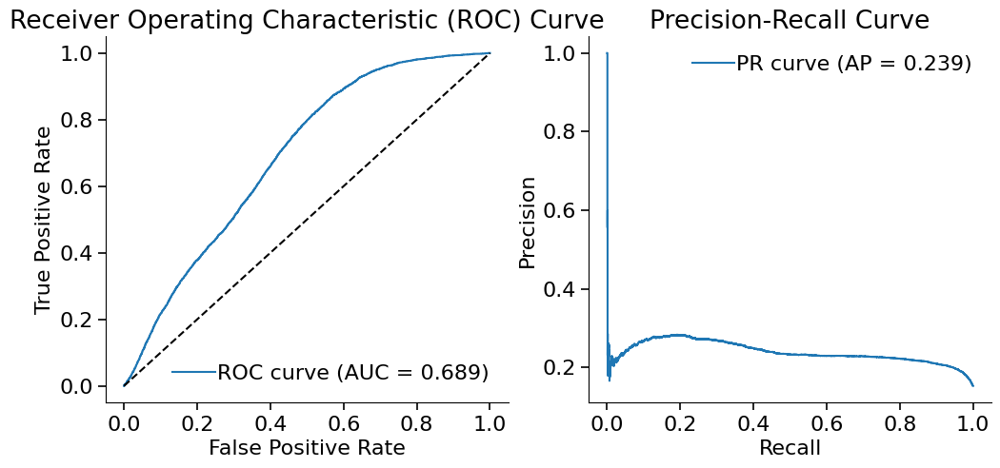

(24.430575408296324, 0.6890477896414012)

In [23]:
error_binary=np.zeros(error_mm.shape)
error_binary[error_mm>0]=1
find_best_threshold(distances[v_idx], error_binary, plot=True)

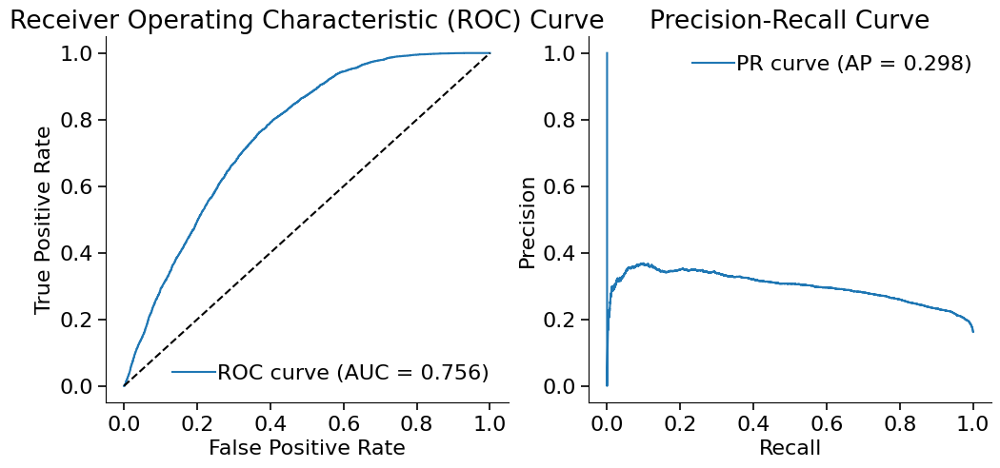

(0.0887522322784785, 0.7556044466187614)

In [24]:
find_best_threshold(diff_layer_lf_mat[v_idx,-1], error_binary, plot=True)

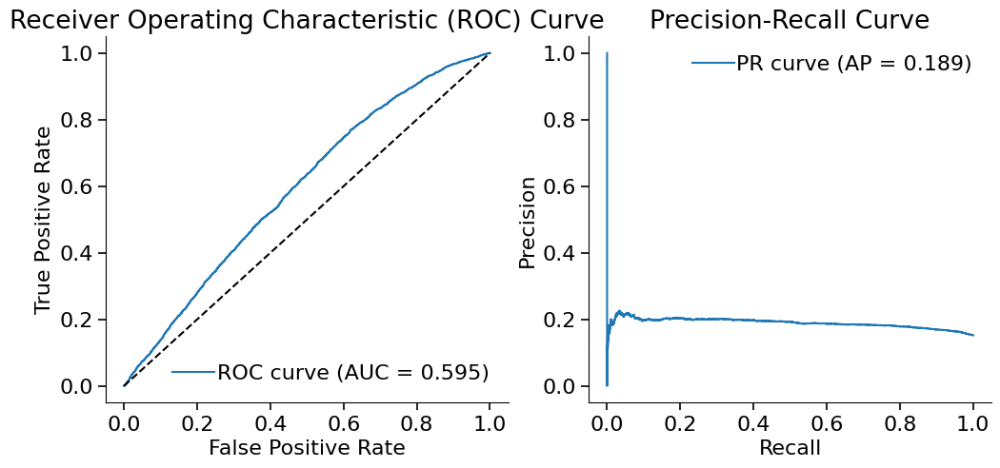

(0.70886886, 0.5952494894773196)

In [25]:
find_best_threshold(dot_products[v_idx], error_binary, plot=True)

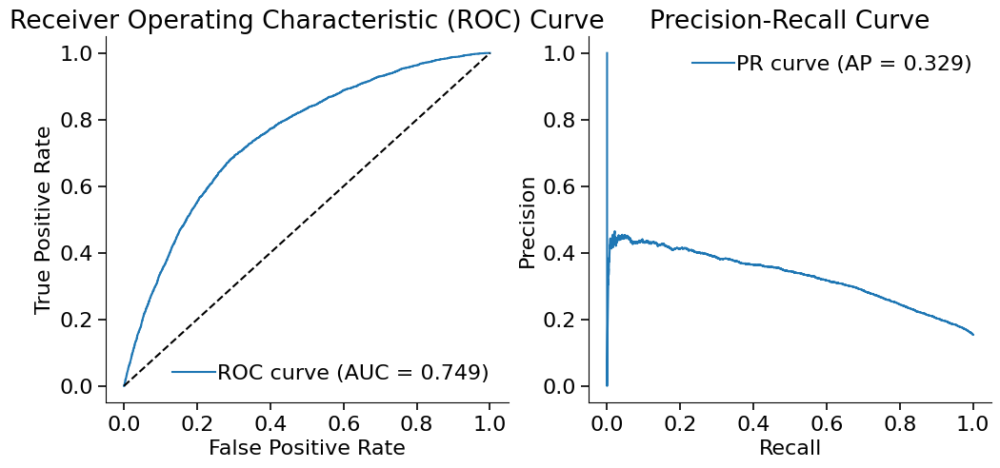

(2.9049363, 0.7488684455952352)

In [26]:
find_best_threshold(thickness[v_idx], error_binary, plot=True)

X variable (AUC=0.689):
  Optimal threshold: 24.431
  Threshold accuracy: 0.496
Y variable (AUC=0.756):
  Optimal threshold: 0.089
  Threshold accuracy: 0.366


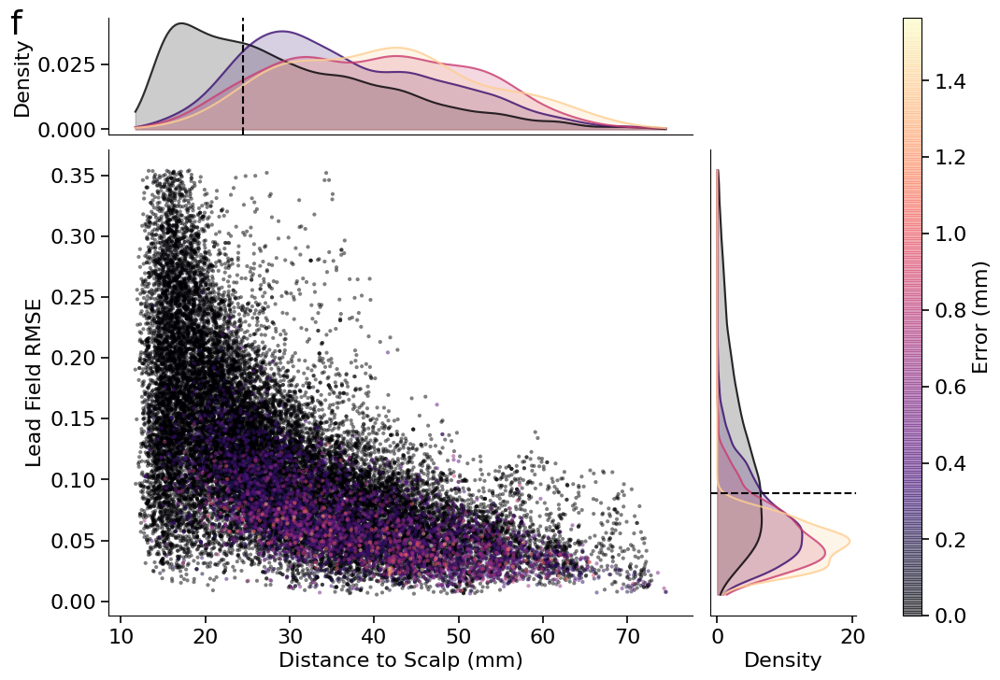

In [27]:
ax=plot_joint_kde(distances[v_idx], diff_layer_lf_mat[v_idx,-1], error_mm, 'Distance to Scalp (mm)', 'Lead Field RMSE','f',y_per=[.1,99.1])
plt.savefig(f"figure_08_dist_lf.pdf", bbox_inches='tight')

X variable (AUC=0.595):
  Optimal threshold: 0.709
  Threshold accuracy: 0.561
Y variable (AUC=0.756):
  Optimal threshold: 0.089
  Threshold accuracy: 0.366


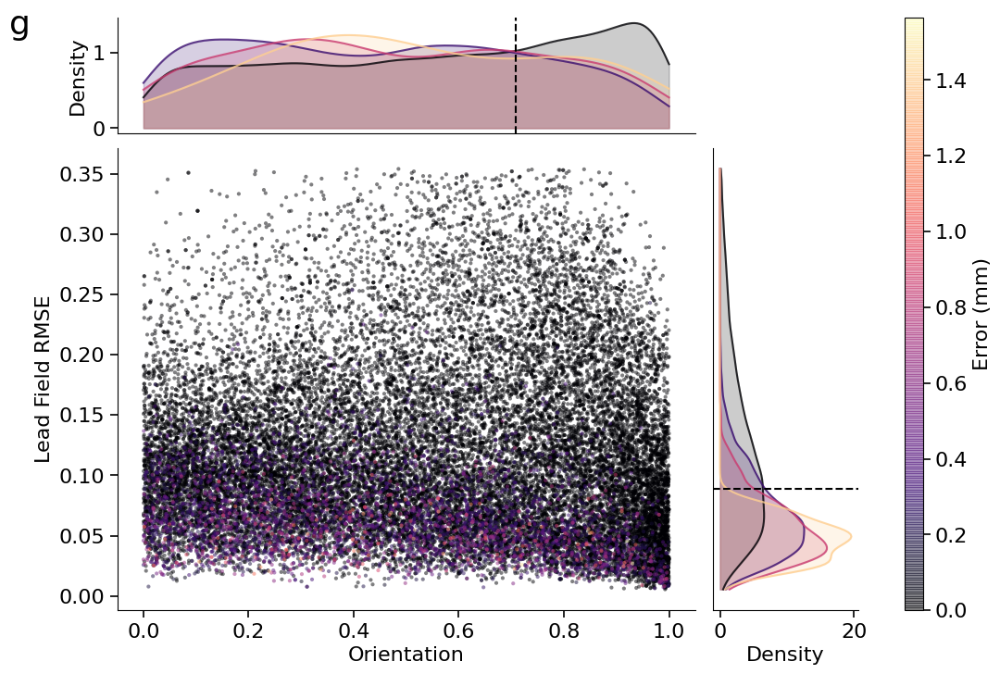

In [28]:
plot_joint_kde(dot_products[v_idx], diff_layer_lf_mat[v_idx,-1], error_mm, 'Orientation', 'Lead Field RMSE','g',y_per=[.1,99.1])
plt.savefig(f"figure_08_ori_lf.pdf", bbox_inches='tight')

X variable (AUC=0.749):
  Optimal threshold: 2.905
  Threshold accuracy: 0.303
Y variable (AUC=0.756):
  Optimal threshold: 0.089
  Threshold accuracy: 0.366


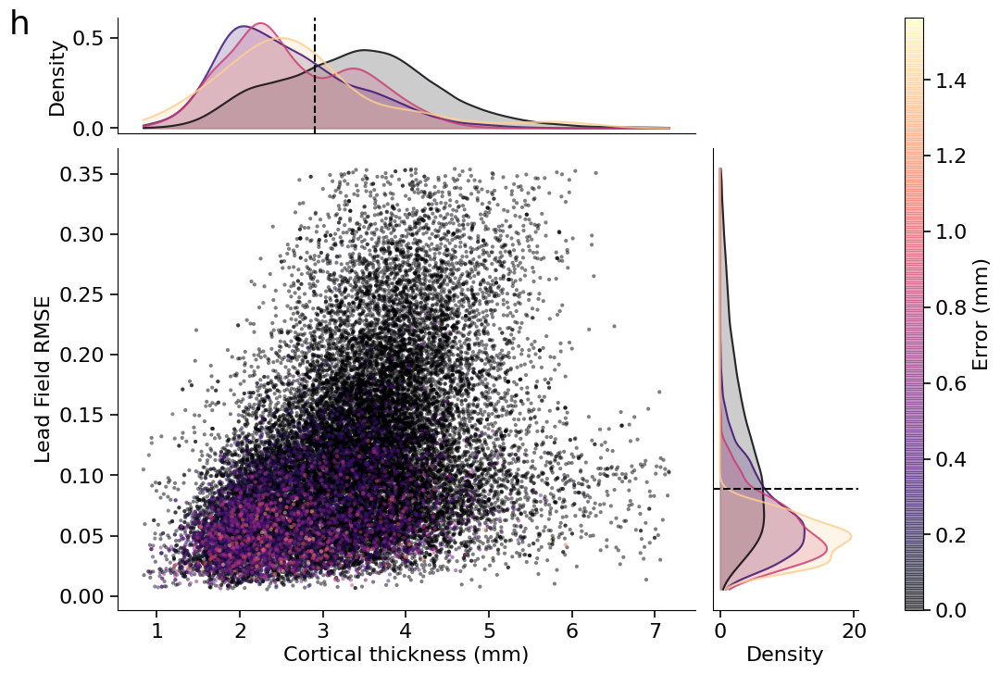

In [29]:
plot_joint_kde(thickness[v_idx], diff_layer_lf_mat[v_idx,-1], error_mm, 'Cortical thickness (mm)', 'Lead Field RMSE','h', x_per=[.1,99.9],y_per=[.1,99.1])
plt.savefig(f"figure_08_thick_lf.pdf", bbox_inches='tight')

In [30]:
data={
    'vertex': [],
    'lead_field_diff': [],
    'ori': [],
    'dist': [],
    'thickness': [],
    'error': []
}
for i,vertex_idx in enumerate(v_idx):
    data['vertex'].append(vertex_idx)
    data['lead_field_diff'].append(diff_layer_lf_mat[vertex_idx,-1])
    data['ori'].append(dot_products[vertex_idx])
    data['dist'].append(distances[vertex_idx])
    data['thickness'].append(thickness[vertex_idx])
    data['error'].append(error_mm[i])
df=pd.DataFrame(data)
df.to_csv(f'source_data_fig_08.csv', index=False)

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

X = np.column_stack([diff_layer_lf_mat[v_idx,-1], dot_products[v_idx], distances[v_idx], thickness[v_idx]])
y = (error_mm == 0).astype(int)

model = LogisticRegression(penalty='l2', solver='liblinear')
model.fit(X, y)
probs = model.predict_proba(X)[:, 1]
auc = roc_auc_score(y, probs)
print(auc)

0.8092586581758294


In [41]:
feature_names = ['LF diff', 'Orientation', 'Distance', 'Thickness']
for name, coef in zip(feature_names, model.coef_[0]):
    print(f"{name}: {coef:.4f}")

LF diff: 10.6404
Orientation: 1.0077
Distance: -0.0195
Thickness: 0.7631


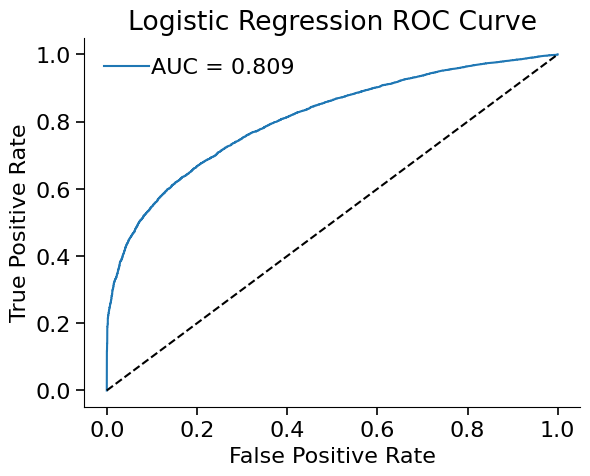

In [42]:
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y, probs)
plt.plot(fpr, tpr, label=f'AUC = {auc:.3f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.legend()
plt.show()

In [43]:
from sklearn.metrics import confusion_matrix

threshold = 0.5  # or choose one using Youden?s J
preds = (probs > threshold).astype(int)
conf_matrix = confusion_matrix(y, preds)
print(conf_matrix)

[[  428  4003]
 [  410 24289]]


In [44]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, X, y, cv=5, scoring='roc_auc')
print(f"Mean CV AUC: {scores.mean():.3f} ± {scores.std():.3f}")

Mean CV AUC: 0.810 ± 0.013


In [45]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_interact = poly.fit_transform(X)

model_interact = LogisticRegression(penalty='l2', solver='liblinear', max_iter=1000)
model_interact.fit(X_interact, y)

probs_interact = model_interact.predict_proba(X_interact)[:, 1]
auc_interact = roc_auc_score(y, probs_interact)
print(f"AUC with interactions: {auc_interact:.3f}")


AUC with interactions: 0.812


In [46]:
scores_interact = cross_val_score(model_interact, X_interact, y, cv=5, scoring='roc_auc')
print(f"Mean CV AUC with interactions: {scores_interact.mean():.3f} ± {scores_interact.std():.3f}")


Mean CV AUC with interactions: 0.812 ± 0.015


In [47]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score

rf = RandomForestClassifier(n_estimators=500, max_depth=None, random_state=42, class_weight='balanced')
rf.fit(X, y)
probs_rf = rf.predict_proba(X)[:, 1]

auc_rf = roc_auc_score(y, probs_rf)
cv_auc = cross_val_score(rf, X, y, cv=5, scoring='roc_auc')

print(f"Training AUC: {auc_rf:.3f}")
print(f"Mean CV AUC: {cv_auc.mean():.3f} ± {cv_auc.std():.3f}")


Training AUC: 0.997
Mean CV AUC: 0.804 ± 0.013


In [48]:
feature_names = ['LF diff', 'Orientation', 'Distance', 'Thickness']
importances = rf.feature_importances_
for name, imp in sorted(zip(feature_names, importances), key=lambda x: -x[1]):
    print(f"{name}: {imp:.3f}")


LF diff: 0.320
Thickness: 0.267
Distance: 0.221
Orientation: 0.191


In [49]:
# Prepare data
df = pd.DataFrame({
    'LF_diff': diff_layer_lf_mat[v_idx, -1],
    'Orientation': dot_products[v_idx],
    'Distance': distances[v_idx],
    'Thickness': thickness[v_idx],
    'Accuracy': (error_mm == 0).astype(int)
})

# Function to fit mediation models and extract effects
def fit_mediation(df):
    results = {}

    predictors = ['Orientation', 'Distance', 'Thickness']

    for predictor in predictors:
        # Mediator model: LF_diff ~ predictor
        X_m = sm.add_constant(df[[predictor]])
        med_model = sm.OLS(df['LF_diff'], X_m).fit()

        # Outcome model: Accuracy ~ LF_diff + predictor
        X_y = sm.add_constant(df[['LF_diff', predictor]])
        out_model = sm.Logit(df['Accuracy'], X_y).fit(disp=0)

        # Paths
        a = med_model.params[predictor]           # predictor ? mediator
        b = out_model.params['LF_diff']           # mediator ? outcome
        c_prime = out_model.params[predictor]     # direct effect

        # Indirect effect
        indirect = a * b

        results[predictor] = {
            'a': a,
            'b': b,
            'c_prime': c_prime,
            'indirect': indirect
        }

    return results

# Bootstrap mediation
def bootstrap_mediation(df, n_boot=1000):
    predictors = ['Orientation', 'Distance', 'Thickness']
    boot_results = {p: [] for p in predictors}

    for _ in range(n_boot):
        df_boot = resample(df)

        res = fit_mediation(df_boot)
        for p in predictors:
            boot_results[p].append(res[p]['indirect'])

    # Compute CI
    ci_results = {}
    for p in predictors:
        vals = np.array(boot_results[p])
        ci_results[p] = {
            'mean_indirect': np.mean(vals),
            'ci_lower': np.percentile(vals, 2.5),
            'ci_upper': np.percentile(vals, 97.5)
        }

    return ci_results

# Run analysis
med_results = fit_mediation(df)
boot_ci = bootstrap_mediation(df, n_boot=5000)

# Print results
for p in med_results:
    print(f"\nPredictor: {p}")
    print(f"  a (-> LF diff): {med_results[p]['a']:.4f}")
    print(f"  b (LF diff -> accuracy): {med_results[p]['b']:.4f}")
    print(f"  Direct effect (c'): {med_results[p]['c_prime']:.4f}")
    print(f"  Indirect effect (a*b): {med_results[p]['indirect']:.4f}")
    print(f"  95% CI: [{boot_ci[p]['ci_lower']:.4f}, {boot_ci[p]['ci_upper']:.4f}]")


Predictor: Orientation
  a (-> LF diff): 0.0022
  b (LF diff -> accuracy): 23.0356
  Direct effect (c'): 1.5135
  Indirect effect (a*b): 0.0509
  95% CI: [-0.0069, 0.1093]

Predictor: Distance
  a (-> LF diff): -0.0037
  b (LF diff -> accuracy): 20.8108
  Direct effect (c'): 0.0023
  Indirect effect (a*b): -0.0769
  95% CI: [-0.0806, -0.0733]

Predictor: Thickness
  a (-> LF diff): 0.0317
  b (LF diff -> accuracy): 15.4763
  Direct effect (c'): 0.6678
  Indirect effect (a*b): 0.4902
  95% CI: [0.4610, 0.5211]
